# Sound inventory size vs. population size
**A bayesian regression analysis with R and Stan（an R interfacSound inventory size vs. population size.<br/>**

> _Bayesian data analysis: count all the ways data can happen, accoding to assumptions. Assumptions with more ways that are consistent with data are more plausible._


Conduct a series of Bayesian regression analyses to test whether an association between two variables(Sound inventory size vs. population size) is genuine, with the rethinking package.<br/>
This effect has been critically discussed in
Steven Moran, Daniel McCloy, and Richard Wright. Revisiting the population vs phoneme- inventory correlation. Language, 88(4):877–893, 2012<br/>

 Specifically, fit the following models:<br/>
* a simple linear regression with log(population size) as independent variable and log(sound inventory size) as dependent variable<br/>
* a hierarchical model with language families as random effect,<br/>
* a hierarchical model with continents as random effect,<br/>
* a hierarchical model with both language families and continents as random effect.<br/>

Use Stan to estimate the posterior distributions.<br/>
Repeat theses analysis with a Poisson regression instead of a linear regression, with untransformed number of phonemes as dependent variable.<br/>

Use prior predictive checks to determine a wisely-chosen prior.<br/>
Model comparison via WAIC.<br/>


**Installing rstan**

In [ ]:
remove.packages("rstan")
if (file.exists(".RData")) file.remove(".RData")

In [85]:
install.packages("rstan", repos = "https://cloud.r-project.org/", dependencies=TRUE)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



Checking the C++ Toolchain

In [86]:
pkgbuild::has_build_tools(debug = TRUE)

Trying to compile a simple C file



Running /usr/local/lib/R/bin/R CMD SHLIB foo.c
gcc -I"/usr/local/lib/R/include" -DNDEBUG   -I"/usr/local/lib/R/site-library/Rcpp/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/unsupported"  -I"/usr/local/lib/R/site-library/BH/include" -I"/usr/local/lib/R/site-library/StanHeaders/include/src/"  -I"/usr/local/lib/R/site-library/StanHeaders/include/"  -I"/usr/local/lib/R/site-library/rstan/include" -DEIGEN_NO_DEBUG  -D_REENTRANT  -DBOOST_DISABLE_ASSERTS -DBOOST_PENDING_INTEGER_LOG2_HPP -include stan/math/prim/mat/fun/Eigen.hpp   -I/usr/local/include  -fpic  -g -O2 -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -g  -c foo.c -o foo.o
In file included from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Core:88,
                 from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Dense:1,
                 from /usr/local/lib/R/site-library/StanHeaders/include/stan/math

[1] FALSE

Configuration of the C++ Toolchain

In [88]:
dotR <- file.path(Sys.getenv("HOME"), ".R")
if (!file.exists(dotR)) dir.create(dotR)
M <- file.path(dotR, ifelse(.Platform$OS.type == "windows", "Makevars.win", "Makevars"))
if (!file.exists(M)) file.create(M)
cat("\nCXX14FLAGS=-O3 -march=native -mtune=native",
    if( grepl("^darwin", R.version$os)) "CXX14FLAGS += -arch x86_64 -ftemplate-depth-256" else 
    if (.Platform$OS.type == "windows") "CXX11FLAGS=-O3 -march=corei7 -mtune=corei7" else
    "CXX14FLAGS += -fPIC",
    file = M, sep = "\n", append = TRUE)

Installing the rethinking package

In [89]:
install.packages(c("mvtnorm","loo","coda"), repos="https://cloud.r-project.org/",dependencies=TRUE)
options(repos=c(getOption('repos'), rethinking='http://xcelab.net/R'))
install.packages('rethinking',type='source')

Installing packages into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message in install.packages(c("mvtnorm", "loo", "coda"), repos = "https://cloud.r-project.org/", :
“installation of package ‘mvtnorm’ had non-zero exit status”
Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



**Enviroment prepare**

In [92]:
library(ggplot2)
library(rethinking)

Data set overview

In [93]:
d <- read.csv('../input/soundInventoryPopulation.csv')
head(d)

,doculect,glottologFamily,iso,population,latitude,longitude,continent,nPhonemes
,<fct>,<fct>,<fct>,<int>,<dbl>,<dbl>,<fct>,<int>
1,MANDARIN,Sino-Tibetan,cmn,897902930,34,110,Asia,43
2,SPANISH,Indo-European,spa,436667750,40,-4,Europe,25
3,ENGLISH,Indo-European,eng,339370920,52,0,Europe,40
4,HINDI,Indo-European,hin,260123420,25,77,Asia,94
5,PORTUGUESE,Indo-European,por,218765470,39,-8,Europe,38
6,BENGALI,Indo-European,ben,189144830,24,90,Asia,53


A simple linear regression

`geom_smooth()` using formula 'y ~ x'



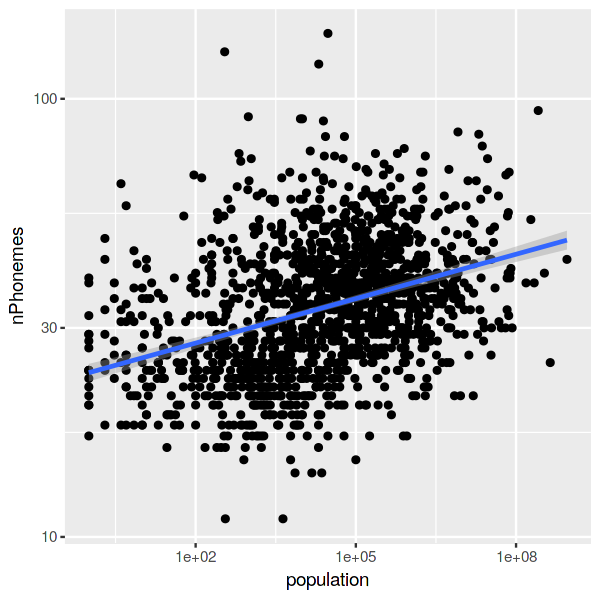

In [94]:
options(repr.plot.width=5, repr.plot.height=5)
ggplot(d, aes(x=population, y=nPhonemes)) +
  geom_point() +
  geom_smooth(method='lm') +
  scale_x_log10() +
  scale_y_log10()

First impression: could be linear corelation

In [95]:
# data pre-process
dd = d[complete.cases(d$population) , ]
dd$log_pop = log(d$population)
dd$log_pop_std = dd$log_pop /mean(dd$log_pop)
dd$np_std = dd$nPhonemes /max(dd$nPhonemes)
dd$log_np = log(d$nPhonemes)


In [96]:
# obtain numbers for later use
print(mean(dd$np_std))
print(mean(dd$log_np))

[1] 0.2506349
[1] 3.501372


**Bayesian linear models**
* m1.0
* m1.1
* m1.2
* m1.3

Prior predictive check(of conventional priors which are apllied in the linear models)

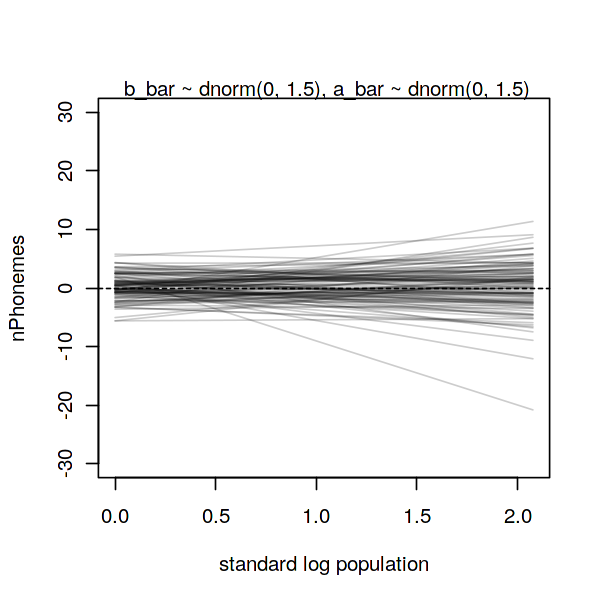

In [97]:
set.seed(1111)
N <- 111
a_bar <- rnorm(N,0, 1.5)
b_bar <- rnorm(N,0, 1.5)
a_sigma <- rexp(N,1)
b_sigma <- rexp(N,1)
sigma <- rexp(N,1)
a <- rnorm(N,a_bar, a_sigma)
b <- rnorm(N,b_bar, b_sigma)

plot( NULL , xlim=range(dd$log_pop_std) , ylim=c(-30,30) ,
      xlab="standard log population" , ylab="nPhonemes" )
abline( h=0 , lty=2 )
abline( h=272 , lty=1 , lwd=0.5 )
mtext( " b_bar ~ dnorm(0, 1.5), a_bar ~ dnorm(0, 1.5)" )
xbar <- mean(dd$np_std)
for ( i in 1:N ) curve( a[i] + b[i]*(x - xbar) ,
                        from=min(dd$log_pop_std) ,
                        to=max(dd$log_pop_std) , 
                        add=TRUE ,
                        col=col.alpha("black",0.2) )

**m1.0** A simple linear regression with log(population size) as independent variable and log(sound inventory size) as dependent variable(bayesian).

In [98]:
dat1.0 = list(
  lpop = dd$log_pop,
  lnp = dd$log_np)

m1.0 <- ulam(
  alist(
    lpop ~ dnorm(mu, sigma),
    mu <- a + b*(lnp - 3.501372),
    # conventional priors
    a ~ dnorm(a_bar, a_sigma),
    a_bar ~ dnorm(0, 1.5),
    b ~ dnorm(b_bar, b_sigma),
    b_bar ~ dnorm(0, 1.5),
    a_sigma ~ dexp(1),
    b_sigma ~ dexp(1),
    sigma ~ dexp(1)
  ), data = dat1.0, chains = 4, cores = 4,iter=1000, log_lik = TRUE)

recompiling to avoid crashing R session

Trying to compile a simple C file



Running /usr/local/lib/R/bin/R CMD SHLIB foo.c
gcc -I"/usr/local/lib/R/include" -DNDEBUG   -I"/usr/local/lib/R/site-library/Rcpp/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/unsupported"  -I"/usr/local/lib/R/site-library/BH/include" -I"/usr/local/lib/R/site-library/StanHeaders/include/src/"  -I"/usr/local/lib/R/site-library/StanHeaders/include/"  -I"/usr/local/lib/R/site-library/rstan/include" -DEIGEN_NO_DEBUG  -D_REENTRANT  -DBOOST_DISABLE_ASSERTS -DBOOST_PENDING_INTEGER_LOG2_HPP -include stan/math/prim/mat/fun/Eigen.hpp   -I/usr/local/include  -fpic  -g -O2 -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -g  -c foo.c -o foo.o
In file included from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Core:88,
                 from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Dense:1,
                 from /usr/local/lib/R/site-library/StanHeaders/include/stan/math

Warning message:
“There were 61 divergent transitions after warmup. Increasing adapt_delta above 0.95 may help. See
http://mc-stan.org/misc/warnings.html#divergent-transitions-after-warmup”
Warning message:
“Examine the pairs() plot to diagnose sampling problems
”
Warning message:
“Tail Effective Samples Size (ESS) is too low, indicating posterior variances and tail quantiles may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#tail-ess”


In [99]:
# Tables of marginal distributions.
precis(m1.0, depth = 2)

,mean,sd,5.5%,94.5%,n_eff,Rhat4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
a,9.924713,0.09138882,9.7810642,10.072655,1748.6502,0.9996242
a_bar,1.116611,1.52741616,-1.3690113,3.602112,1811.3547,1.0001958
b,3.971147,0.26348619,3.5515357,4.386101,1871.7406,1.0004582
b_bar,2.032514,1.51269135,-0.6280127,4.078862,926.3179,1.0039689
a_sigma,4.603341,1.40461249,2.7509073,7.120609,1577.3686,1.0007633
b_sigma,1.746199,1.20993565,0.2282084,3.846690,965.8653,1.0006380
sigma,3.579381,0.06531432,3.4757904,3.684233,1298.3791,1.0004087


Conclude from the table stats, a fine model with reasonable n_eff(about the sample size) and Rhat(approaching 1) values.

In [100]:
WAIC(m1.0)

WAIC,lppd,penalty,std_err
<dbl>,<dbl>,<dbl>,<dbl>
7843.843,-3918.964,2.957615,55.40991


Posterior **m1.0**

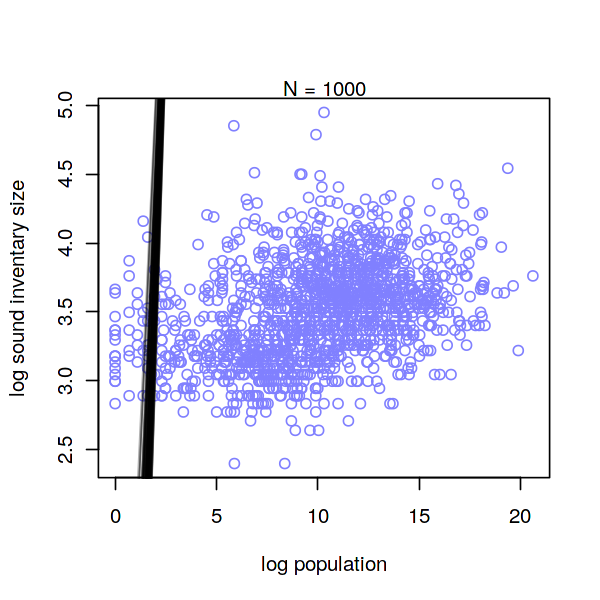

In [101]:
# posterior
post1.0 <- extract.samples( m1.0 )
# display raw data and sample size
plot( dd$log_pop , dd$log_np ,
      xlim=range(dd$log_pop) , ylim=range(dd$log_np) ,
      col=rangi2 , xlab="log population" , ylab="log sound inventary size" )
mtext(concat("N = ",1000))
# plot the lines, with transparency
for ( i in 1:100 )
  curve( post1.0$a[i] + post1.0$b[i]*(x-3.501372) ,
         col=col.alpha("black",0.3) , add=TRUE )

A corelation between the 2 variables can be seen from the posterior plot. So far still unclear if the corelation is fake or not.

**m1.1** A hierarchical model with language families as random effect.

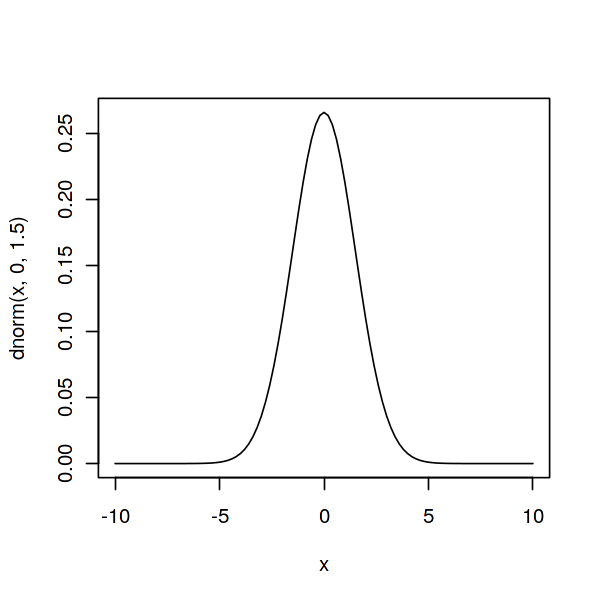

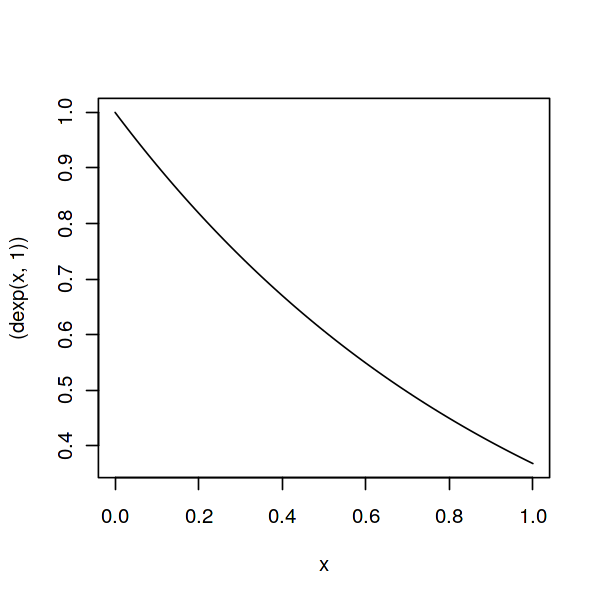

In [102]:
# prior predictive simulation for the conventional priors
curve( dnorm( x , 0 , 1.5 ) , from= -10 , to=10 )
curve((dexp(x, 1)))

In [103]:
dat1.1 <- list(
  pop = dd$log_pop_std,
  np = dd$np_std,
  lf = as.integer(dd$glottologFamily)
)
m1.1 <- ulam(
  alist(
    pop ~ dnorm(mu, sigma),
    mu <- a[lf] + b[lf]*(np - 0.2506349),
    # conventional priors
    a[lf] ~ dnorm(a_bar, a_sigma),
    a_bar ~ dnorm(0, 1.5),
    b[lf] ~ dnorm(b_bar, b_sigma),
    b_bar ~ dnorm(0, 1.5),
    a_sigma ~ dexp(1),
    b_sigma ~ dexp(1),
    sigma ~ dexp(1)
  ), data = dat1.1, chains = 4, cores = 4,iter=1000, log_lik = TRUE)

recompiling to avoid crashing R session

Trying to compile a simple C file



Running /usr/local/lib/R/bin/R CMD SHLIB foo.c
gcc -I"/usr/local/lib/R/include" -DNDEBUG   -I"/usr/local/lib/R/site-library/Rcpp/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/unsupported"  -I"/usr/local/lib/R/site-library/BH/include" -I"/usr/local/lib/R/site-library/StanHeaders/include/src/"  -I"/usr/local/lib/R/site-library/StanHeaders/include/"  -I"/usr/local/lib/R/site-library/rstan/include" -DEIGEN_NO_DEBUG  -D_REENTRANT  -DBOOST_DISABLE_ASSERTS -DBOOST_PENDING_INTEGER_LOG2_HPP -include stan/math/prim/mat/fun/Eigen.hpp   -I/usr/local/include  -fpic  -g -O2 -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -g  -c foo.c -o foo.o
In file included from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Core:88,
                 from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Dense:1,
                 from /usr/local/lib/R/site-library/StanHeaders/include/stan/math

Warning message:
“There were 4 chains where the estimated Bayesian Fraction of Missing Information was low. See
http://mc-stan.org/misc/warnings.html#bfmi-low”
Warning message:
“Examine the pairs() plot to diagnose sampling problems
”
Warning message:
“The largest R-hat is 1.27, indicating chains have not mixed.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#r-hat”
Warning message:
“Bulk Effective Samples Size (ESS) is too low, indicating posterior means and medians may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#bulk-ess”
Warning message:
“Tail Effective Samples Size (ESS) is too low, indicating posterior variances and tail quantiles may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#tail-ess”


In [104]:
# Tables of marginal distributions.
precis(m1.1, depth = 2)

,mean,sd,5.5%,94.5%,n_eff,Rhat4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
a[1],1.1720346,0.14075978,0.94321628,1.3996483,1327.6286,1.0012455
a[2],1.1911885,0.03211423,1.14050517,1.2422082,1445.5522,1.0082169
a[3],0.6297207,0.18520881,0.33441346,0.9274609,2755.6858,0.9996605
a[4],0.6917898,0.12078284,0.49779649,0.8821837,3300.6724,0.9987145
a[5],0.6824297,0.19236938,0.38805881,0.9887941,3760.8652,0.9986539
a[6],0.7995860,0.19144491,0.50485293,1.1151670,4579.4115,0.9993052
a[7],0.4272070,0.19634973,0.11337523,0.7369717,2913.9199,0.9994694
a[8],1.0640864,0.18763351,0.76882531,1.3639722,3185.5804,0.9989641
a[9],0.6903510,0.04862527,0.61359775,0.7668969,1291.6735,1.0052505


Conclude from the table stats, fine model with reasonable n_eff(about the sample size) and Rhat(approach 1) values.

In [105]:
WAIC(m1.1)

WAIC,lppd,penalty,std_err
<dbl>,<dbl>,<dbl>,<dbl>
226.5067,7.552162,120.8055,59.23912


Posterior **m1.1**

In [106]:
# posterior
post1.1 <- extract.samples( m1.1 )
post1.1

1.2669842,1.198255,0.5978224,0.6447653,0.3803033,0.5955955,0.71781807,0.8788036,0.6340190,0.5665821,⋯,0.6000219,0.7936264,0.6322810,0.45254513,0.4796523,0.60357444,0.6087326,0.9968208,0.3221086,1.0095124
1.3722986,1.207350,0.6720459,0.5080738,0.9865359,0.7355762,0.37853802,1.1658359,0.7234224,0.8466820,⋯,0.8431064,0.9388144,0.6691424,0.45185216,0.5392302,0.63108499,0.6463338,0.9618147,0.5159901,0.7606683
1.3980823,1.142811,0.7197352,0.6472319,0.5669455,0.5278837,0.41627198,0.8502218,0.7324754,0.7160748,⋯,0.8025500,1.1016488,0.4999404,0.67984519,0.6493412,0.19682497,0.6752726,0.9172987,0.6304794,0.7672108
0.8865319,1.194321,0.4399057,0.8794955,0.8495358,0.6837155,0.24129247,0.7871984,0.8449954,0.8405557,⋯,1.1199573,0.9636645,0.4424177,0.59810576,0.6899983,0.26653010,0.8009024,1.0306641,0.7100904,0.6623278
1.0654412,1.192441,0.3840390,0.5174212,0.7971802,0.9583440,0.46460407,0.9222814,0.6796201,0.6905584,⋯,0.9015180,0.9361876,0.3438872,0.38439361,0.7321985,0.52115467,0.6754574,1.0963439,0.4343746,0.6496810
1.2456903,1.204778,0.6341578,0.6941226,0.7566799,0.5275057,0.34395554,1.1272476,0.7214214,0.7866489,⋯,1.1099350,0.9491982,0.7588982,0.75078526,0.5218951,0.21820858,0.6938130,0.9531790,0.4021904,0.6807047
1.1289850,1.174391,0.6698818,0.7318738,0.7578678,0.8211346,0.37341044,0.7978902,0.7817122,0.6222644,⋯,0.6312325,0.8884127,0.5772961,0.37234358,0.9049213,0.12963922,0.5341614,0.7678670,0.4810009,1.1123363
1.2039010,1.134031,0.3762871,0.7397116,0.8820006,0.7412550,0.30633809,1.1246341,0.7626337,0.6602841,⋯,0.7596739,0.8035124,0.6036993,0.02257259,0.6023925,0.76966808,0.7588665,1.0302667,0.3205564,0.6454724
1.0309036,1.184930,0.7014996,0.8444420,1.0699766,0.7418052,0.64967710,1.0251197,0.7048923,1.0584716,⋯,1.0217189,0.6956241,0.6769232,0.33685968,0.6813268,0.70432866,0.9210687,0.7674555,0.2944633,0.9322252
1.1336058,1.258098,0.7686992,0.8070530,0.8593456,0.7596505,0.18359775,1.3729807,0.6814358,0.7243264,⋯,1.5192842,0.8769717,0.8410779,0.73339928,0.4200631,0.26112145,0.8615107,1.0454307,0.5012372,0.7463612
1.1111974,1.180819,0.2821751,0.6750789,0.5914931,0.8239804,0.33291335,0.7473776,0.6948898,0.8159079,⋯,0.8066511,1.1448357,0.7977442,0.19209690,0.3853834,0.35178691,0.8339511,0.8713968,0.4537621,0.8205320


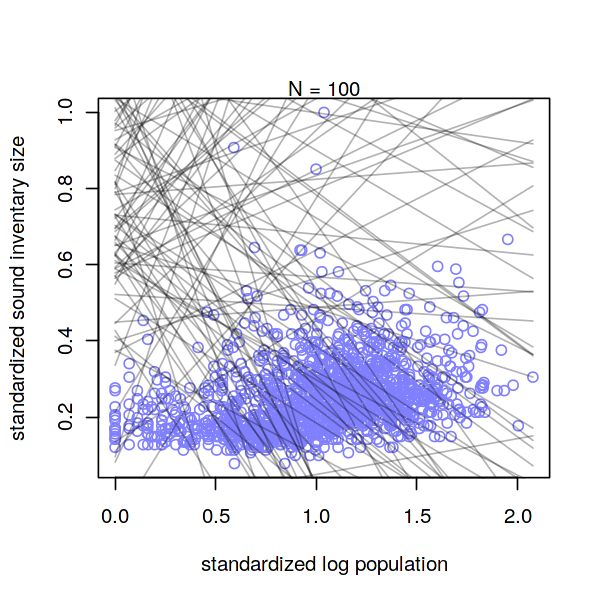

In [107]:
# display raw data and sample size
plot( dd$log_pop_std , dd$np_std ,
      xlim=range(dd$log_pop_std) , ylim=range(dd$np_std) ,
      col=rangi2 , xlab="standardized log population" , ylab="standardized sound inventary size" )
mtext(concat("N = ",100))

# change j(1:5) to alter glotto family(random effect control)
j = 1

# plot the lines, with transparency
for ( i in 1:100 )
  curve( post1.1$a[j,i] + post1.1$b[j,i]*(x-0.2506349) ,
         col=col.alpha("black",0.3) , add=TRUE )

The correaltion does not show within each language family from the posterior plots of each langauge, we have a first evidence that the corelation can be fake.

**m1.2** A hierarchical model with continents as random effect

In [108]:
#data pre-process
d$log_pop <- log(d$population)
dd <- d[complete.cases(d$population) , ]
dd$log_pop_std <- dd$log_pop /mean(dd$log_pop)
dd$np_std <- dd$nPhonemes /max(dd$nPhonemes)

head(dd)

,doculect,glottologFamily,iso,population,latitude,longitude,continent,nPhonemes,log_pop,log_pop_std,np_std
,<fct>,<fct>,<fct>,<int>,<dbl>,<dbl>,<fct>,<int>,<dbl>,<dbl>,<dbl>
1,MANDARIN,Sino-Tibetan,cmn,897902930,34,110,Asia,43,20.61557,2.075913,0.3049645
2,SPANISH,Indo-European,spa,436667750,40,-4,Europe,25,19.89468,2.003322,0.1773050
3,ENGLISH,Indo-European,eng,339370920,52,0,Europe,40,19.64260,1.977938,0.2836879
4,HINDI,Indo-European,hin,260123420,25,77,Asia,94,19.37667,1.951159,0.6666667
5,PORTUGUESE,Indo-European,por,218765470,39,-8,Europe,38,19.20351,1.933723,0.2695035
6,BENGALI,Indo-European,ben,189144830,24,90,Asia,53,19.05802,1.919073,0.3758865


In [109]:
dat1.2 <- list(
  pop = dd$log_pop_std,
  np = dd$np_std,
  cid = as.integer(dd$continent)
)


m1.2 <- ulam(
  alist(
    pop ~ dnorm(mu, sigma),
    mu <- a[cid] + b[cid]*(np - 0.2506349),
    # conventianl priors
    a[cid] ~ dnorm(a_bar, a_sigma),
    a_bar ~ dnorm(0, 1.5),
    b[cid] ~ dnorm(b_bar, b_sigma),
    b_bar ~ dnorm(0, 1.5),
    a_sigma ~ dexp(1),
    b_sigma ~ dexp(1),
    sigma ~ dexp(1)
  ), data = dat1.2, chains = 4, cores = 4,iter=1000, log_lik = TRUE)

recompiling to avoid crashing R session

Trying to compile a simple C file



Running /usr/local/lib/R/bin/R CMD SHLIB foo.c
gcc -I"/usr/local/lib/R/include" -DNDEBUG   -I"/usr/local/lib/R/site-library/Rcpp/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/unsupported"  -I"/usr/local/lib/R/site-library/BH/include" -I"/usr/local/lib/R/site-library/StanHeaders/include/src/"  -I"/usr/local/lib/R/site-library/StanHeaders/include/"  -I"/usr/local/lib/R/site-library/rstan/include" -DEIGEN_NO_DEBUG  -D_REENTRANT  -DBOOST_DISABLE_ASSERTS -DBOOST_PENDING_INTEGER_LOG2_HPP -include stan/math/prim/mat/fun/Eigen.hpp   -I/usr/local/include  -fpic  -g -O2 -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -g  -c foo.c -o foo.o
In file included from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Core:88,
                 from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Dense:1,
                 from /usr/local/lib/R/site-library/StanHeaders/include/stan/math

Warning message:
“There were 4 divergent transitions after warmup. Increasing adapt_delta above 0.95 may help. See
http://mc-stan.org/misc/warnings.html#divergent-transitions-after-warmup”
Warning message:
“Examine the pairs() plot to diagnose sampling problems
”


In [110]:
# Tables of marginal distributions.
precis(m1.2, depth = 2)

,mean,sd,5.5%,94.5%,n_eff,Rhat4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
a[1],1.15847296,0.014354519,1.13544095,1.18125145,2140.8216,1.0022152
a[2],1.21633548,0.021573375,1.18222878,1.25070550,2083.5122,1.0005858
a[3],1.35010341,0.039015463,1.28806326,1.41189677,1857.2746,0.9999243
a[4],0.51858520,0.039220698,0.45554010,0.58293085,1779.8495,1.0002598
a[5],0.83207886,0.035234804,0.77686716,0.88949303,940.7470,1.0027144
a[6],0.77136145,0.025768749,0.73026015,0.81251648,1155.5619,0.9992988
a_bar,0.95569704,0.184116397,0.64844135,1.21766468,846.8531,1.0059664
b[1],0.05016267,0.142290849,-0.18631865,0.26834198,1589.0869,1.0018974
b[2],0.17939707,0.196361964,-0.13352190,0.49885540,1908.1392,0.9997179


Conclude from the table stats, A fine model with reasonable n_eff(about the sample size) and Rhat(approach 1) values.

In [111]:
WAIC(m1.2)

WAIC,lppd,penalty,std_err
<dbl>,<dbl>,<dbl>,<dbl>
695.1837,-333.6636,13.92824,59.72885


Posterior **m1.2**

In [112]:
# posterior
post1.2 <- extract.samples( m1.2 )
post1.2

1.161557,1.237168,1.323413,0.5247308,0.7970190,0.7802553
1.163653,1.190059,1.308637,0.5391644,0.8334552,0.7879001
1.167071,1.246733,1.352480,0.4805302,0.8265578,0.7529966
1.154433,1.222685,1.316763,0.5005368,0.8869087,0.8106514
1.181298,1.165127,1.366799,0.5239312,0.8798214,0.7684050
1.178992,1.270581,1.336475,0.5580827,0.8554795,0.7351258
1.173784,1.247899,1.351208,0.4459740,0.8560675,0.7693922
1.172873,1.254365,1.364430,0.4924387,0.8347516,0.7326009
1.148359,1.225620,1.356222,0.5528144,0.9282206,0.7732920
1.177673,1.223718,1.362951,0.5132251,0.9111601,0.7768956
1.142194,1.188670,1.336012,0.5167205,0.8172758,0.7388617


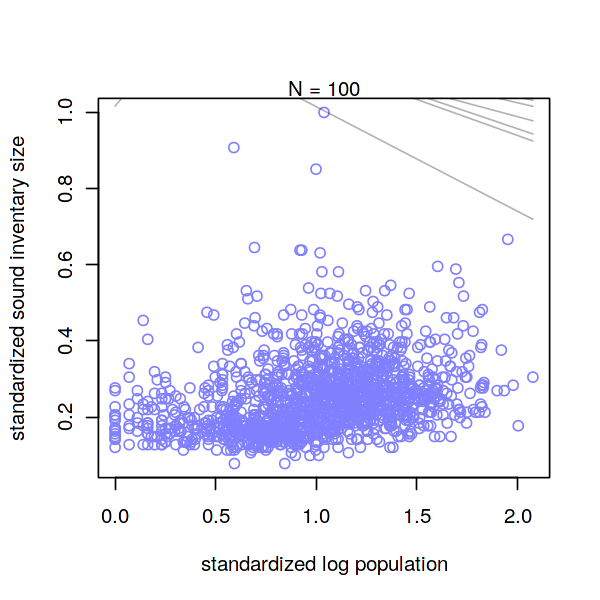

In [113]:
# display raw data and sample size
plot( dd$log_pop_std , dd$np_std ,
      xlim=range(dd$log_pop_std) , ylim=range(dd$np_std) ,
      col=rangi2 , xlab="standardized log population" , ylab="standardized sound inventary size" )
mtext(concat("N = ",100))

# change j(1:6) to alter continent(random effect control)
j = 2

# plot the lines, with transparency
for ( i in 1:100 )
  curve( post1.2$a[i,j] + post1.2$b[i,j]*(x - 0.2506349),
         col=col.alpha("black",0.3) , add=TRUE )

The correaltion does not show within each language family from the posterior plot, we have a further evidence that the corelation can be fake.

**m1.3** A hierarchical model with both language families and continents as random effect.

In [114]:
#data pre-process
d$log_pop <- log(d$population)
dd <- d[complete.cases(d$population) , ]
dd$log_pop_std <- dd$log_pop /mean(dd$log_pop)
dd$np_std <- dd$nPhonemes /max(dd$nPhonemes)

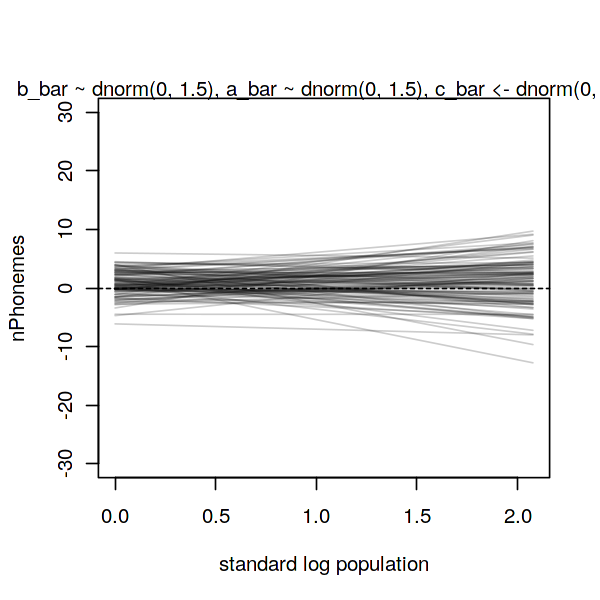

In [115]:
# prior predictive check
set.seed(1111)
N <- 111
a_bar <- rnorm(N,0, 1.5)
b_bar <- rnorm(N,0, 1.5)
c_bar <- dnorm(0, 1.5)
a_sigma <- rexp(N,1)
b_sigma <- rexp(N,1)
sigma <- rexp(N,1)
c_sigma <- rexp(N,1)
a <- rnorm(N,a_bar, a_sigma)
b <- rnorm(N,b_bar, b_sigma)
c <- dnorm(c_bar, c_sigma)

plot( NULL , xlim=range(dd$log_pop_std) , ylim=c(-30,30) ,
      xlab="standard log population" , ylab="nPhonemes" )
abline( h=0 , lty=2 )
abline( h=272 , lty=1 , lwd=0.5 )
mtext( " b_bar ~ dnorm(0, 1.5), a_bar ~ dnorm(0, 1.5), c_bar <- dnorm(0, 1.5)" )
xbar <- mean(dd$np_std)
for ( i in 1:N ) curve( a[i] + c[i] + b[i]*(x - 0.2506349) ,
                        from=min(dd$log_pop_std) ,
                        to=max(dd$log_pop_std) , 
                        add=TRUE ,
                        col=col.alpha("black",0.2) )

In [116]:
dat1.3 <- list(
  pop = dd$log_pop_std,
  np = dd$np_std,
  cid = as.integer(dd$continent),
  lf = as.integer(dd$glottologFamily)
)


m1.3 <- ulam(
  alist(
    pop ~ dnorm(mu, sigma),
    # a questionable parameter b
    mu <- c[lf] + a[cid] + b*(np - 0.2506349),
    # conventional priors
    a[cid] ~ dnorm(a_bar, a_sigma),
    a_bar ~ dnorm(0, 1.5),
    b ~ dnorm(b_bar, b_sigma),
    b_bar ~ dnorm(0, 1.5),
    c[lf] ~ dnorm(c_bar, c_sigma),
    c_bar ~ dnorm(0, 1.5),
    a_sigma ~ dexp(1),
    b_sigma ~ dexp(1),
    c_sigma ~ dexp(1),
    sigma ~ dexp(1)
  ), data = dat1.3, chains = 4, cores = 4,iter=1000, log_lik = TRUE)

recompiling to avoid crashing R session

Trying to compile a simple C file



Running /usr/local/lib/R/bin/R CMD SHLIB foo.c
gcc -I"/usr/local/lib/R/include" -DNDEBUG   -I"/usr/local/lib/R/site-library/Rcpp/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/unsupported"  -I"/usr/local/lib/R/site-library/BH/include" -I"/usr/local/lib/R/site-library/StanHeaders/include/src/"  -I"/usr/local/lib/R/site-library/StanHeaders/include/"  -I"/usr/local/lib/R/site-library/rstan/include" -DEIGEN_NO_DEBUG  -D_REENTRANT  -DBOOST_DISABLE_ASSERTS -DBOOST_PENDING_INTEGER_LOG2_HPP -include stan/math/prim/mat/fun/Eigen.hpp   -I/usr/local/include  -fpic  -g -O2 -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -g  -c foo.c -o foo.o
In file included from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Core:88,
                 from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Dense:1,
                 from /usr/local/lib/R/site-library/StanHeaders/include/stan/math

Warning message:
“There were 42 divergent transitions after warmup. Increasing adapt_delta above 0.95 may help. See
http://mc-stan.org/misc/warnings.html#divergent-transitions-after-warmup”
Warning message:
“Examine the pairs() plot to diagnose sampling problems
”
Warning message:
“The largest R-hat is 2.36, indicating chains have not mixed.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#r-hat”
Warning message:
“Bulk Effective Samples Size (ESS) is too low, indicating posterior means and medians may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#bulk-ess”
Warning message:
“Tail Effective Samples Size (ESS) is too low, indicating posterior variances and tail quantiles may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#tail-ess”


In [117]:
# Tables of marginal distributions.
precis(m1.3, depth = 2)

,mean,sd,5.5%,94.5%,n_eff,Rhat4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
a[1],1.263846401,0.39624191,0.7036255,1.8824370,2.846022,2.803605
a[2],1.181026559,0.39738542,0.6122608,1.8147157,2.838684,2.827826
a[3],1.133521280,0.39855213,0.5624557,1.7637834,2.859018,2.755177
a[4],0.684553695,0.39869722,0.1142416,1.3068292,2.847335,2.724904
a[5],0.928525156,0.39515571,0.3621723,1.5517404,2.806856,2.871375
a[6],0.924245452,0.39662320,0.3685232,1.5563895,2.818231,2.893116
a_bar,1.010971957,0.41210196,0.4056607,1.6634286,3.079862,2.315332
b,0.054773545,0.09229015,-0.0939952,0.2057299,1188.030521,1.000939
b_bar,0.069973918,0.76117258,-1.1319112,1.2782378,369.750658,1.007508


A bad model...

**Model comparison: linear models**

In [118]:
WAIC(m1.3)
compare(m1.0, m1.1, m1.2, m1.3)

WAIC,lppd,penalty,std_err
<dbl>,<dbl>,<dbl>,<dbl>
220.8398,-9.438836,100.9811,60.34064


,WAIC,SE,dWAIC,dSE,pWAIC,weight
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
m1.3,220.8398,60.34064,0.000000,NA,100.981054,9.444585e-01
m1.1,226.5067,59.23912,5.666962,13.75753,120.805533,5.554152e-02
m1.2,695.1837,59.72885,474.343871,42.40687,13.928236,9.391175e-104
m1.0,7843.8430,55.40991,7623.003199,54.77930,2.957615,0.000000e+00


Posterior **m1.3**

In [119]:
# posterior
post1.3 <- extract.samples( m1.3 )
post1.3

1.4621750,1.3312536,1.3823975,0.84664765,1.0603107,1.0742256
0.9479038,0.9232309,0.8345892,0.40363556,0.6728836,0.6456206
1.0603960,1.0511328,0.9241327,0.51165233,0.7463253,0.8162294
1.0801205,0.9568804,0.8593947,0.48492673,0.7458087,0.7390014
0.6794873,0.5684266,0.4356678,0.23845685,0.3496258,0.3387640
0.5409224,0.5991874,0.5393849,0.05947958,0.2923986,0.2506294
0.7267112,0.5742583,0.5029427,0.17070587,0.3704403,0.3962464
1.0816259,0.9917260,0.8642779,0.53087388,0.7149730,0.7284914
1.3858543,1.2649250,1.2761402,0.74620758,0.9884026,1.0245774
0.7654713,0.7025032,0.6331986,0.11760046,0.4371686,0.3800508
1.2206372,1.1275754,1.1027224,0.68834012,0.8517785,0.9076669


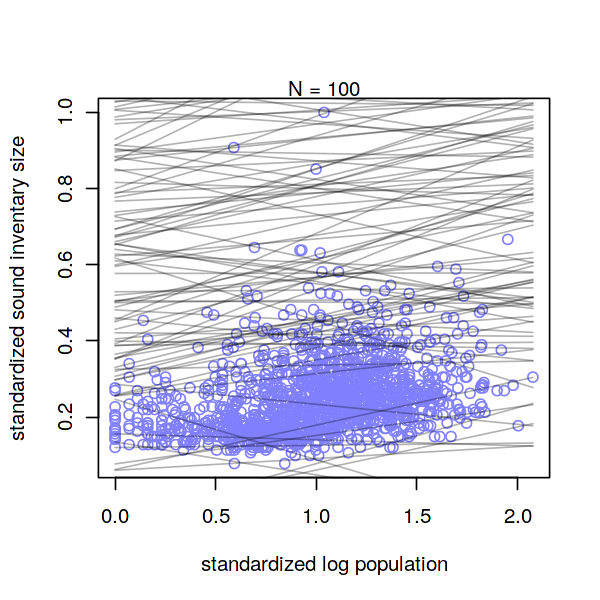

In [120]:
# display raw data and sample size
plot( dd$log_pop_std , dd$np_std ,
      xlim=range(dd$log_pop_std) , ylim=range(dd$np_std) ,
      col=rangi2 , xlab="standardized log population" , ylab="standardized sound inventary size" )
mtext(concat("N = ",100))

# change j(1:6) to alter continent(random effect control)
j = 1

# change k(1:5) to alter language family(random effect control)
k = 1

# plot the lines, with transparency
for ( i in 1:100 )
  curve( post1.3$a[i,k] +post1.3$c[j,i] + post1.3$b[i]*(x - 0.2506349),
         col=col.alpha("black",0.3) , add=TRUE )

**Brief sum linear models** <br>Absolutely no sign of a corelation between the 2 variables with 2 random effects being considered at the same time. Given the observations from previous 3 models, we can draw the conclusion that the corelation between the 2 variable of intrests is fake, at least not linear.

**Bayesian Poisson models**
* m2.0
* m2.1
* m2.2
* m2.3

Prior predictive checks

[1] 35.33952

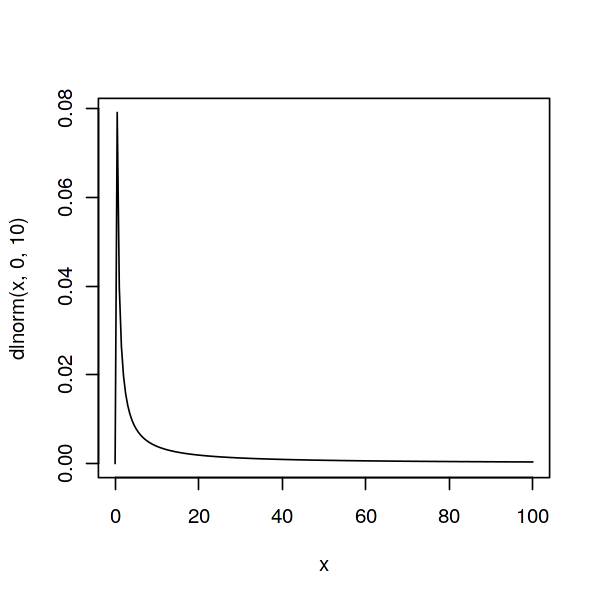

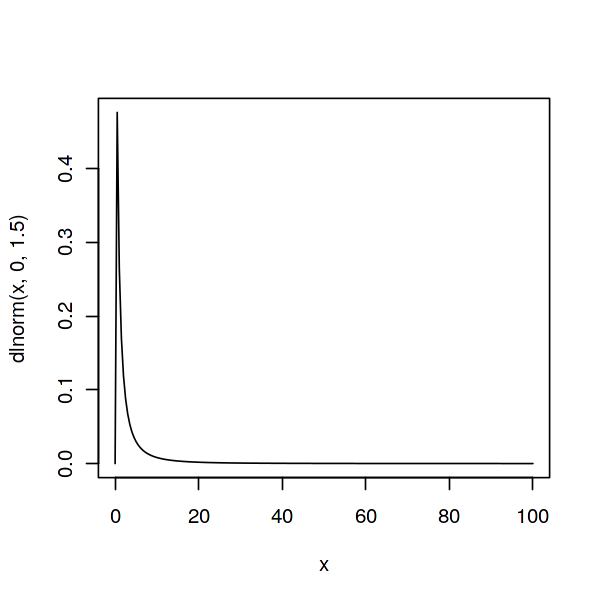

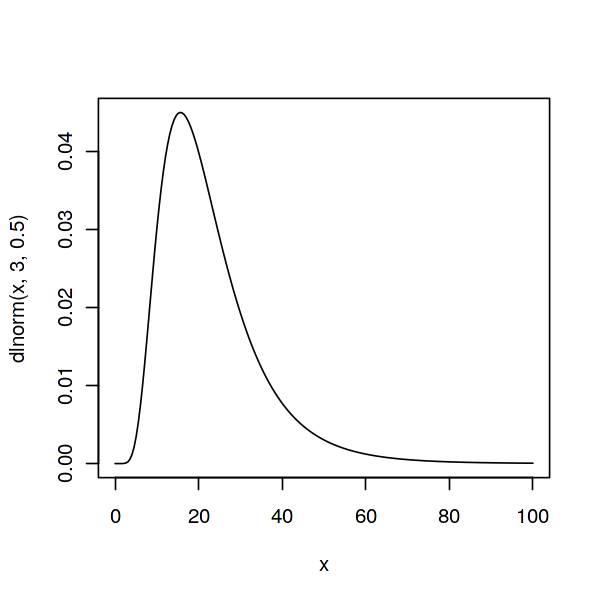

[1] 4.669115e+12

[1] 22.85991

[1] 37.81012

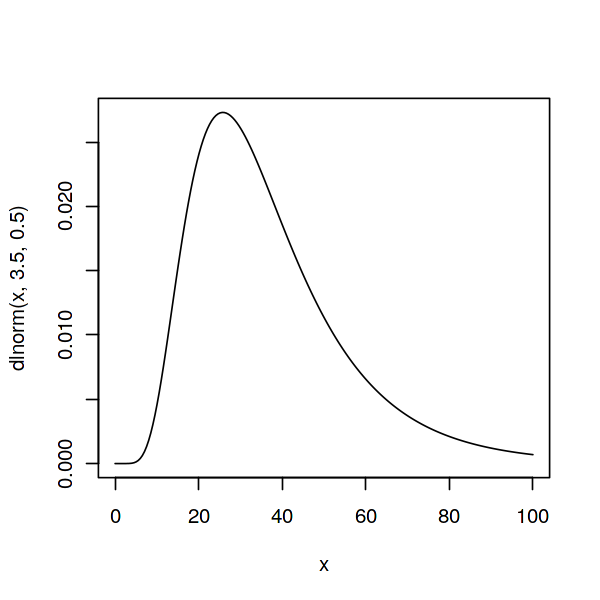

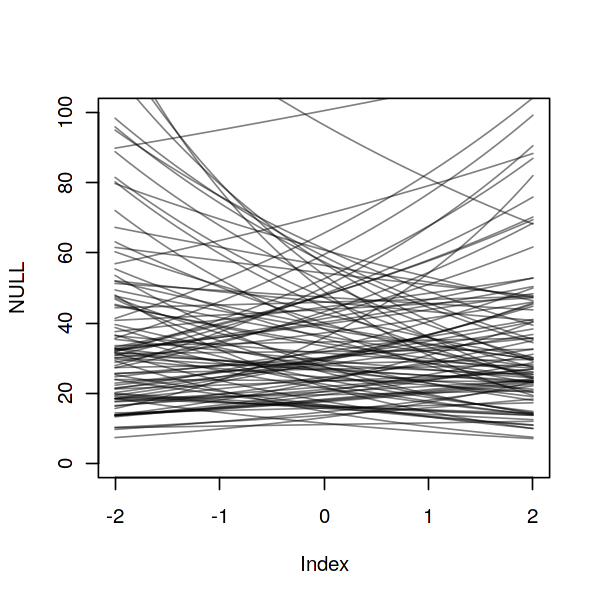

In [121]:
# prior predictive checks to determine proper prior for poisson models

mean(d$nPhonemes)

curve( dlnorm( x , 0 , 10 ) , from=0 , to=100 , n=200 )
curve( dlnorm( x , 0 , 1.5 ) , from=0 , to=100 , n=200 )
curve( dlnorm( x , 3 , 0.5 ) , from=0 , to=100 , n=200 )
# optimal prior
curve( dlnorm( x , 3.5 , 0.5 ) , from=0 , to=100 , n=200 )


a <- rnorm(1e4,0,10)
lambda <- exp(a)
mean( lambda )

a <- rnorm(1e4, 3, 0.5)
lambda <- exp(a)
mean( lambda )

# optimal prior: close to mean(d$nPhonemes)
a <- rnorm(1e4, 3.5, 0.5)
lambda <- exp(a)
mean( lambda )


# determine prior beta
set.seed(10)
N <- 100
a <- rnorm( N , 3.5 , 0.5 )
b <- rnorm( N , 0 , 0.2 )
plot( NULL , xlim=c(-2,2) , ylim=c(0,100) )
for ( i in 1:N ) curve( exp( a[i] + b[i]*x ) , add=TRUE , col=col.alpha("black",0.5) )

**m2.0** A simple Poisson regression without randowm effects.

In [122]:
dat2.0 <- list(
  pop = dd$log_pop_std,
  np = d$nPhonemes
)

m2.0 <- ulam(
  alist(
    np ~ dpois(lambda),
    log(lambda) <- a + b*pop,
    # optimal priors
    a ~ dnorm(3.5, 0.5),
    b ~ dnorm(0, 0.2)
  ), data = dat2.0, chains = 4, log_lik = TRUE)

recompiling to avoid crashing R session

Trying to compile a simple C file



Running /usr/local/lib/R/bin/R CMD SHLIB foo.c
gcc -I"/usr/local/lib/R/include" -DNDEBUG   -I"/usr/local/lib/R/site-library/Rcpp/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/unsupported"  -I"/usr/local/lib/R/site-library/BH/include" -I"/usr/local/lib/R/site-library/StanHeaders/include/src/"  -I"/usr/local/lib/R/site-library/StanHeaders/include/"  -I"/usr/local/lib/R/site-library/rstan/include" -DEIGEN_NO_DEBUG  -D_REENTRANT  -DBOOST_DISABLE_ASSERTS -DBOOST_PENDING_INTEGER_LOG2_HPP -include stan/math/prim/mat/fun/Eigen.hpp   -I/usr/local/include  -fpic  -g -O2 -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -g  -c foo.c -o foo.o
In file included from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Core:88,
                 from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Dense:1,
                 from /usr/local/lib/R/site-library/StanHeaders/include/stan/math

In [123]:
precis(m2.0, depth = 2)

,mean,sd,5.5%,94.5%,n_eff,Rhat4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
a,3.2406908,0.01282593,3.2202991,3.2613883,462.0016,1.009044
b,0.3168659,0.01150447,0.2980358,0.3346187,472.3494,1.007971


Posterior **m2.0**

In [124]:
# posterior
post2.0 <- extract.samples( m2.0 )
post2.0

$a
   [1] 3.222507 3.241628 3.260525 3.269000 3.229116 3.235761 3.233233 3.246397
   [9] 3.234222 3.249061 3.207698 3.237394 3.254655 3.245125 3.260944 3.238410
  [17] 3.241177 3.226873 3.237168 3.216244 3.237187 3.233276 3.244042 3.267311
  [25] 3.234349 3.234319 3.220212 3.234305 3.233307 3.249878 3.237759 3.252384
  [33] 3.248931 3.252266 3.234530 3.254219 3.215554 3.239486 3.225650 3.232355
  [41] 3.244772 3.227416 3.218942 3.223452 3.247008 3.236072 3.244983 3.223905
  [49] 3.254154 3.228640 3.226772 3.225874 3.249917 3.221017 3.250724 3.241169
  [57] 3.247545 3.247332 3.246003 3.251978 3.231913 3.250057 3.231065 3.266296
  [65] 3.228323 3.251363 3.264951 3.227557 3.251854 3.251907 3.240218 3.263894
  [73] 3.261906 3.234341 3.249165 3.253874 3.246741 3.267442 3.210125 3.277550
  [81] 3.247396 3.246967 3.250659 3.254291 3.233146 3.245261 3.238100 3.270288
  [89] 3.232717 3.232320 3.236411 3.227217 3.234598 3.270202 3.239974 3.215120
  [97] 3.232974 3.243133 3.249643 3.237774 3.238418 3.252317 3.238761 3.227320
 [105] 3.267512 3.238461 3.220350 3.255863 3.239997 3.219421 3.262563 3.215195
 [113] 3.254142 3.242912 3.248690 3.238462 3.235202 3.241152 3.254088 3.236233
 [121] 3.218494 3.246350 3.255362 3.240582 3.226589 3.269832 3.238326 3.244292
 [129] 3.246687 3.250344 3.238549 3.258072 3.249115 3.234582 3.243865 3.270046
 [137] 3.249329 3.235614 3.234615 3.262017 3.221731 3.242820 3.244607 3.249321
 [145] 3.262594 3.254824 3.235362 3.248909 3.241188 3.236061 3.247474 3.215574
 [153] 3.231562 3.226965 3.249797 3.230334 3.233352 3.220299 3.260331 3.242882
 [161] 3.237181 3.245294 3.232652 3.218734 3.253345 3.234881 3.250572 3.258194
 [169] 3.241319 3.227954 3.233197 3.251844 3.234154 3.259548 3.245931 3.232920
 [177] 3.250378 3.250776 3.245576 3.248769 3.207393 3.245257 3.234812 3.223579
 [185] 3.263919 3.228951 3.253630 3.237949 3.249122 3.234644 3.235168 3.257511
 [193] 3.254384 3.234728 3.240596 3.257988 3.244453 3.247256 3.251222 3.247150
 [201] 3.247529 3.235934 3.235589 3.259854 3.218281 3.245465 3.260481 3.256492
 [209] 3.249757 3.257768 3.215518 3.233043 3.233912 3.246355 3.233809 3.261642
 [217] 3.226431 3.229319 3.223164 3.256797 3.245545 3.236990 3.251671 3.236466
 [225] 3.243299 3.243622 3.252965 3.230838 3.225395 3.242596 3.221923 3.246916
 [233] 3.240167 3.246688 3.236156 3.247130 3.229876 3.249522 3.266726 3.250503
 [241] 3.218368 3.233054 3.249830 3.255355 3.217841 3.238824 3.245140 3.218140
 [249] 3.243295 3.236749 3.226896 3.252450 3.246970 3.235856 3.256162 3.248150
 [257] 3.232791 3.237731 3.247937 3.229816 3.239320 3.241358 3.226632 3.230061
 [265] 3.231446 3.223110 3.259220 3.224360 3.257183 3.227114 3.249486 3.249459
 [273] 3.247113 3.255306 3.238032 3.229454 3.256754 3.235152 3.226197 3.230572
 [281] 3.249897 3.232904 3.249568 3.211104 3.230379 3.256674 3.251942 3.227375
 [289] 3.241602 3.223096 3.223732 3.257006 3.231917 3.219775 3.257406 3.261389
 [297] 3.237894 3.249842 3.214171 3.250588 3.237614 3.239585 3.238049 3.253308
 [305] 3.251758 3.241482 3.228853 3.254808 3.248115 3.251148 3.260031 3.228884
 [313] 3.255169 3.230722 3.252713 3.228369 3.234140 3.232600 3.222826 3.235201
 [321] 3.256256 3.239001 3.243392 3.235826 3.223261 3.237688 3.245041 3.237599
 [329] 3.249064 3.261151 3.232566 3.261431 3.251226 3.218396 3.243729 3.252358
 [337] 3.241665 3.221916 3.223676 3.239758 3.244416 3.255775 3.259687 3.236925
 [345] 3.223520 3.230132 3.224036 3.242643 3.251072 3.266806 3.262873 3.250718
 [353] 3.203711 3.231686 3.220660 3.259960 3.262638 3.222082 3.247808 3.241582
 [361] 3.243300 3.247509 3.226836 3.238070 3.268694 3.217037 3.226470 3.246365
 [369] 3.243002 3.243942 3.239503 3.248478 3.236705 3.256182 3.223669 3.239725
 [377] 3.240188 3.248191 3.244031 3.263864 3.257322 3.232336 3.250710 3.251599
 [385] 3.266666 3.222594 3.245237 3.248867 3.222233 3.230100 3.242908 3.235477
 [393] 3.229971 3.231925 3.238207 3.230793 3.240432 3.251749 3.244874 3.224811
 [401] 3.248938 3.232108 3.261184 3.247955 3.25

packages installed on Kaggle do not support LOOPk() function, this part has to be ran in rstudio.

In [ ]:
# posterior
k <- LOOPk(m2.0)
plot( dd$log_pop_std , d$nPhonemes , xlab="standardized log population" , ylab="nPhonemes" ,
      col=rangi2 , pch=1 , lwd=2 ,
      ylim=c(0,75) , cex=1+normalize(k) )
# set up the horizontal axis values to compute predictions at
ns <- 100
P_seq <- seq( from=-1.4 , to=3 , length.out=ns )

lambda <- link( m2.0 , data=data.frame( pop=P_seq) )
lmu <- apply( lambda , 2 , mean )
lci <- apply( lambda , 2 , PI )
lines( P_seq , lmu , lty=2 , lwd=1.5 )
shade( lci , P_seq , xpd=TRUE )

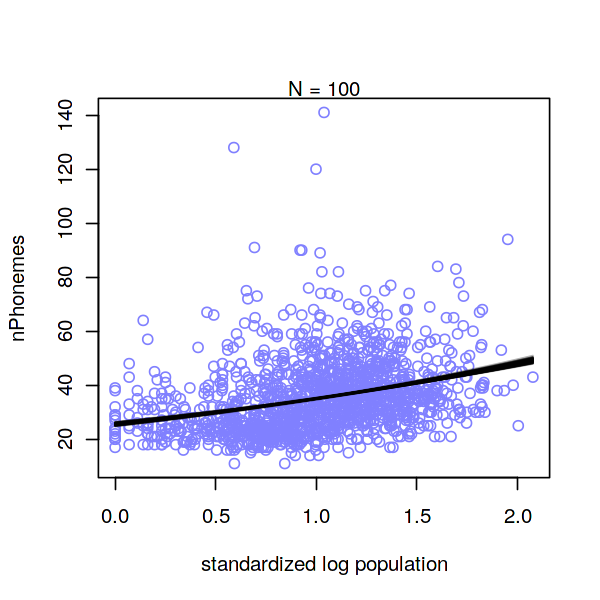

In [125]:
# display raw data and sample size
plot( dd$log_pop_std , d$nPhonemes ,
      xlim=range(dd$log_pop_std) , ylim=range(d$nPhonemes) ,
      col=rangi2 , xlab="standardized log population" , ylab="nPhonemes" )
mtext(concat("N = ",100))

# plot the lines, with transparency
for ( i in 1:100 )
  curve( exp(post2.0$a[i] + post2.0$b[i]*x),
         col=col.alpha("black",0.3) , add=TRUE )

First impression from simple poisson model with no random effects: a corelation can be seen in the posterior plot. Comparing to the previous corresponding simple linear model(m1.0), the corelation seems to be better captured by Poisson model.

**m2.1** A hierarchical model with language families as random effect(a Poisson regression instead of a linear regression)

In [126]:
dat2.1 <- list(
  pop = dd$log_pop_std,
  np = d$nPhonemes,
  lf = as.integer(dd$glottologFamily)
)

m2.1 <- ulam(
  alist(
    np ~ dpois(lambda),
    log(lambda) <- a[lf] + b[lf]*pop,
    # optimal priors
    a[lf] ~ dnorm(3.5, 0.5),
    b[lf] ~ dnorm(0, 0.2)
  ), data = dat2.1, chains = 4, log_lik = TRUE)

Trying to compile a simple C file



Running /usr/local/lib/R/bin/R CMD SHLIB foo.c
gcc -I"/usr/local/lib/R/include" -DNDEBUG   -I"/usr/local/lib/R/site-library/Rcpp/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/unsupported"  -I"/usr/local/lib/R/site-library/BH/include" -I"/usr/local/lib/R/site-library/StanHeaders/include/src/"  -I"/usr/local/lib/R/site-library/StanHeaders/include/"  -I"/usr/local/lib/R/site-library/rstan/include" -DEIGEN_NO_DEBUG  -D_REENTRANT  -DBOOST_DISABLE_ASSERTS -DBOOST_PENDING_INTEGER_LOG2_HPP -include stan/math/prim/mat/fun/Eigen.hpp   -I/usr/local/include  -fpic  -g -O2 -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -g  -c foo.c -o foo.o
In file included from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Core:88,
                 from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Dense:1,
                 from /usr/local/lib/R/site-library/StanHeaders/include/stan/math

In [127]:
# Tables of marginal distributions.
precis(m2.1, depth = 2)

,mean,sd,5.5%,94.5%,n_eff,Rhat4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
a[1],3.960518,0.24408968,3.570849,4.366890,1830.025,1.0007677
a[2],3.512668,0.07716634,3.387609,3.636608,1696.612,0.9992373
a[3],3.459884,0.18515691,3.160288,3.747088,2845.625,0.9990281
a[4],3.343253,0.14000625,3.121155,3.572069,1955.995,1.0021261
a[5],3.285950,0.21625769,2.940584,3.628118,3479.517,0.9992806
a[6],3.129110,0.23738759,2.750111,3.506231,2658.623,0.9990087
a[7],3.132628,0.19459019,2.811544,3.431223,3138.651,0.9994453
a[8],3.318907,0.26556864,2.899034,3.739102,2409.564,1.0007072
a[9],3.231873,0.07302473,3.112671,3.345395,1795.069,1.0035983


Conclude from the table stats, fine model with n_eff values about the sample size and fine Rhat values appraoching 1.

In [128]:
WAIC(m2.1)

WAIC,lppd,penalty,std_err
<dbl>,<dbl>,<dbl>,<dbl>
11148.5,-5345.807,228.4444,188.083


Posterior **m2.1**

In [129]:
# posterior
post2.1 <- extract.samples( m2.1 )
post2.1

4.191370,3.438650,3.609536,3.332513,3.259800,3.297484,3.126111,3.128631,3.306123,3.156535,⋯,3.706178,2.779053,3.534866,4.350371,3.499554,3.748248,3.133869,3.538962,3.243473,3.961083
4.171150,3.488619,3.318993,3.558976,3.402478,2.946392,3.115646,3.636650,3.171074,3.027619,⋯,3.549746,3.183482,3.500025,3.996109,3.376570,3.824911,3.503926,3.261049,3.097960,3.880843
4.028991,3.580747,2.971361,3.267646,3.116644,3.312678,3.035615,3.877072,3.207441,3.253626,⋯,3.759744,3.179677,3.432523,3.923456,3.400528,3.525222,3.282007,3.646408,3.139865,3.998825
4.069260,3.532824,3.434315,3.210169,3.286618,3.005226,3.241596,3.181775,3.166265,3.281463,⋯,3.557615,3.227298,3.431221,4.087660,3.658466,3.578310,3.285077,3.425818,3.189720,3.520337
4.115604,3.511738,3.952923,3.332252,3.303362,3.233457,3.056688,3.697705,3.305190,3.153810,⋯,3.917479,3.008074,3.420458,3.995994,3.213316,3.424069,3.126504,3.175212,3.014076,3.830266
3.864462,3.606776,3.256151,3.361170,3.060051,2.965094,3.492914,3.580792,3.173375,3.248097,⋯,3.740853,2.802196,3.756237,4.061581,3.350911,3.591079,3.379074,3.760858,2.933622,4.019575
4.199821,3.570414,3.540166,3.329863,3.240540,3.025507,3.131781,3.534134,3.229414,3.138309,⋯,3.685256,2.704846,3.705369,4.099817,3.408315,3.468837,3.105598,3.481200,2.954674,3.904569
3.366035,3.538837,3.713595,3.295762,3.339922,3.113790,2.945354,3.655291,3.191622,2.962212,⋯,3.851461,3.279331,3.437267,4.021408,3.713311,3.527587,3.719418,3.778235,3.077833,3.813193
3.492679,3.387425,3.394722,3.414002,3.430555,3.271057,3.398558,3.179889,3.362654,2.993911,⋯,3.546005,2.853036,3.554080,4.020885,3.566792,3.494357,3.654899,3.331662,2.917059,3.942568
3.900585,3.488285,3.232409,3.195267,3.269131,3.653353,3.548171,3.523650,3.194737,3.025631,⋯,3.803438,2.955734,3.186527,3.900193,3.436470,3.397562,3.434292,3.672315,2.870030,3.788523
3.712498,3.508904,3.624806,3.438810,3.231817,2.911543,3.267858,3.128759,3.237502,3.186586,⋯,3.549277,2.815315,3.869498,3.934558,3.745621,3.467367,3.141771,3.522380,3.125227,4.019550


packages installed on Kaggle do not support LOOPk() function, this block has to be ran in rstudio.

In [ ]:
# posterior
k <- LOOPk(m2.1)
plot( dd$log_pop_std , d$nPhonemes , xlab="standardized log population" , ylab="nPhonemes" ,
      col=rangi2 , pch =ifelse( as.integer(dd$glottologFamily)==5 , 19 , 3 ), lwd=1 ,
      ylim=c(0,75) , cex=1+normalize(k) )

# set up the horizontal axis values to compute predictions at
ns <- 100
P_seq <- seq( from=-1.4 , to=3 , length.out=ns )

# change lf to alter language family(random effect control)
lambda <- link( m2.1 , data=data.frame( pop=P_seq , lf=5 ) )
lmu <- apply( lambda , 2 , mean )
lci <- apply( lambda , 2 , PI )
lines( P_seq , lmu , lty=2 , lwd=1.5 )
shade( lci , P_seq , xpd=TRUE )

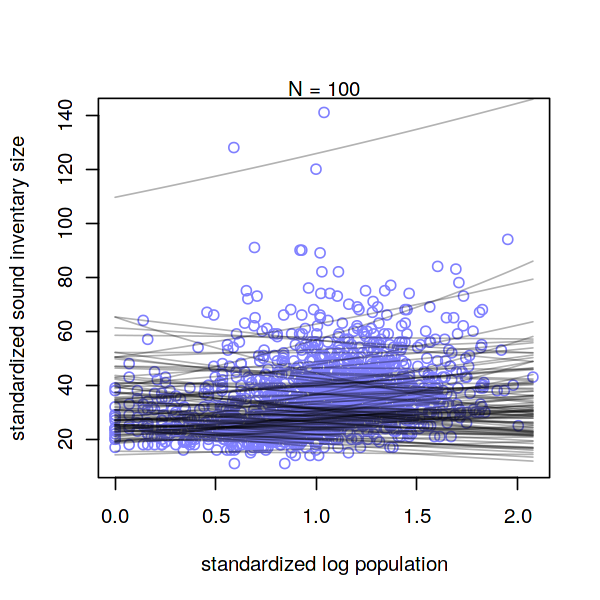

In [130]:
# display raw data and sample size
plot( dd$log_pop_std , d$nPhonemes ,
      xlim=range(dd$log_pop_std) , ylim=range(d$nPhonemes) ,
      col=rangi2 , xlab="standardized log population" , ylab="standardized sound inventary size" )
mtext(concat("N = ",100))

# change lf(1:5) to alter language family(random effect control)
lf = 5

# plot the lines, with transparency
for ( i in 1:100 )
  curve( exp(post2.1$a[lf,i] + post2.1$b[lf,i]*x),
         col=col.alpha("black",0.3) , add=TRUE )

From the posterior plot, the correlation betwen the 2 variables of interests can be observed in m2.1, within each lanaguge family.

**m2.2** A hierarchical model with continents as random effect(a Poisson regression instead of a linear regression).

In [131]:
dat2.2 <- list(
  pop = dd$log_pop_std,
  np = d$nPhonemes,
  cid = as.integer(dd$continent)
)

m2.2 <- ulam(
  alist(
    np ~ dpois(lambda),
    log(lambda) <- a[cid] + b[cid]*pop,
    # optimal priors
    a[cid] ~ dnorm(3.5, 0.5),
    b[cid] ~ dnorm(0, 0.2)
  ), data = dat2.2, chains = 4, log_lik = TRUE)

Trying to compile a simple C file



Running /usr/local/lib/R/bin/R CMD SHLIB foo.c
gcc -I"/usr/local/lib/R/include" -DNDEBUG   -I"/usr/local/lib/R/site-library/Rcpp/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/unsupported"  -I"/usr/local/lib/R/site-library/BH/include" -I"/usr/local/lib/R/site-library/StanHeaders/include/src/"  -I"/usr/local/lib/R/site-library/StanHeaders/include/"  -I"/usr/local/lib/R/site-library/rstan/include" -DEIGEN_NO_DEBUG  -D_REENTRANT  -DBOOST_DISABLE_ASSERTS -DBOOST_PENDING_INTEGER_LOG2_HPP -include stan/math/prim/mat/fun/Eigen.hpp   -I/usr/local/include  -fpic  -g -O2 -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -g  -c foo.c -o foo.o
In file included from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Core:88,
                 from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Dense:1,
                 from /usr/local/lib/R/site-library/StanHeaders/include/stan/math

In [132]:
# tables of marginal distributions
precis(m2.2, depth = 2)

,mean,sd,5.5%,94.5%,n_eff,Rhat4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
a[1],3.69564881,0.03301473,3.643023696,3.74961549,2002.453,0.9985347
a[2],3.67447288,0.03694542,3.615452288,3.73423066,1738.613,1.0001997
a[3],4.08589244,0.06532541,3.984834960,4.19011175,1852.098,1.0021757
a[4],3.58512801,0.04052565,3.521811737,3.65134282,2178.187,1.0001477
a[5],3.13246597,0.03057650,3.083892057,3.18061049,1974.859,1.0000720
a[6],3.19058561,0.02910739,3.143293305,3.23858716,1572.468,0.9996776
b[1],0.01984383,0.02778151,-0.025490534,0.06430992,2060.080,0.9984110
b[2],0.04096229,0.02862837,-0.005309539,0.08670815,1741.265,1.0009426
b[3],-0.25133434,0.04870453,-0.328667107,-0.17566677,1850.479,1.0028480


Conclude from the table stats, fine n_eff values and Rhat values.

In [133]:
WAIC(m2.2)

WAIC,lppd,penalty,std_err
<dbl>,<dbl>,<dbl>,<dbl>
12019.7,-5963.339,46.51008,272.8042


Posterior **m2.2**

In [134]:
# posterior
post2.2 <- extract.samples( m2.2 )
post2.2

3.683813,3.672743,4.024688,3.630048,3.102050,3.211190
3.756937,3.692224,4.020890,3.611342,3.116227,3.192626
3.698573,3.726907,4.139990,3.600174,3.128141,3.192831
3.746141,3.636390,4.064738,3.549771,3.142335,3.162399
3.689594,3.721349,4.073592,3.566521,3.138369,3.226494
3.742409,3.725252,4.157875,3.580452,3.108804,3.133212
3.735199,3.643075,4.132751,3.641331,3.126996,3.239253
3.712166,3.677988,4.076645,3.582352,3.151214,3.178948
3.695604,3.718741,4.002819,3.643566,3.123707,3.162692
3.733540,3.643220,4.135015,3.586614,3.122250,3.168571
3.643329,3.663623,4.004217,3.559041,3.140242,3.172838


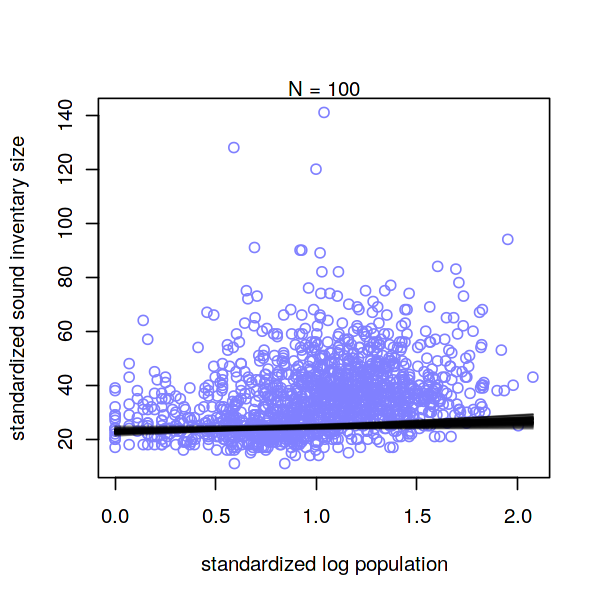

In [135]:
# display raw data and sample size
plot( dd$log_pop_std , d$nPhonemes ,
      xlim=range(dd$log_pop_std) , ylim=range(d$nPhonemes) ,
      col=rangi2 , xlab="standardized log population" , ylab="standardized sound inventary size" )
mtext(concat("N = ",100))

# change cid(1:6) to alter continent(random effect control)
cid = 5

# plot the lines, with transparency
for ( i in 1:100 )
  curve( exp(post2.2$a[i,cid] + post2.2$b[i,cid]*x),
         col=col.alpha("black",0.3) , add=TRUE )

package installed on kaggle does not support function LOOPk(), this part has to be ran in rstudio

In [148]:
# posterior
k <- LOOPk(m2.2)
plot( dd$log_pop_std , d$nPhonemes , xlab="standardized log population" , ylab="nPhonemes" ,
      col=rangi2 , pch =ifelse( as.integer(dd$continent)==5 , 19 , 3 ), lwd=1 ,
      ylim=c(0,75) , cex=1+normalize(k) )

# set up the horizontal axis values to compute predictions at
ns <- 100
P_seq <- seq( from=-1.4 , to=3 , length.out=ns )

# change lf to alter language family(random effect control)
lambda <- link( m2.2 , data=data.frame( pop=P_seq , cid=5 ) )
lmu <- apply( lambda , 2 , mean )
lci <- apply( lambda , 2 , PI )
lines( P_seq , lmu , lty=2 , lwd=1.5 )
shade( lci , P_seq , xpd=TRUE )


ERROR: Error in LOOPk(m2.2): could not find function "LOOPk"


From the posterior plot, the correlation betwen the 2 variables of interests can be observed in m2.1, within each continent.

**m2.3** A hierarchical model with both language family and continents as random effects(a Poisson regression instead of a linear regression).

In [136]:
#data pre-process
d$log_pop <- log(d$population)
dd <- d[complete.cases(d$population) , ]
dd$log_pop_std <- dd$log_pop /mean(dd$log_pop)

In [137]:
dat2.3 <- list(
  pop = dd$log_pop_std,
  np = d$nPhonemes,
  cid = as.integer(dd$continent),
  lf = as.integer(dd$glottologFamily)
)


m2.3 <- ulam(
  alist(
    np ~ dpois(lambda),
    log(lambda) <- c[lf] + a[cid] + b*pop,
    a[cid] ~ dnorm(3.5, 0.5),
    b ~ dnorm(0, 0.2),
    c[lf] ~ dnorm(3.5, 0.5)
  ), data = dat2.3, chains = 4, log_lik = TRUE)

Trying to compile a simple C file



Running /usr/local/lib/R/bin/R CMD SHLIB foo.c
gcc -I"/usr/local/lib/R/include" -DNDEBUG   -I"/usr/local/lib/R/site-library/Rcpp/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/"  -I"/usr/local/lib/R/site-library/RcppEigen/include/unsupported"  -I"/usr/local/lib/R/site-library/BH/include" -I"/usr/local/lib/R/site-library/StanHeaders/include/src/"  -I"/usr/local/lib/R/site-library/StanHeaders/include/"  -I"/usr/local/lib/R/site-library/rstan/include" -DEIGEN_NO_DEBUG  -D_REENTRANT  -DBOOST_DISABLE_ASSERTS -DBOOST_PENDING_INTEGER_LOG2_HPP -include stan/math/prim/mat/fun/Eigen.hpp   -I/usr/local/include  -fpic  -g -O2 -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -g  -c foo.c -o foo.o
In file included from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Core:88,
                 from /usr/local/lib/R/site-library/RcppEigen/include/Eigen/Dense:1,
                 from /usr/local/lib/R/site-library/StanHeaders/include/stan/math

Warning message:
“Bulk Effective Samples Size (ESS) is too low, indicating posterior means and medians may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#bulk-ess”
Warning message:
“Tail Effective Samples Size (ESS) is too low, indicating posterior variances and tail quantiles may be unreliable.
Running the chains for more iterations may help. See
http://mc-stan.org/misc/warnings.html#tail-ess”


In [138]:
# tables of marginal distributions
precis(m2.3, depth =2) 

,mean,sd,5.5%,94.5%,n_eff,Rhat4
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
a[1],0.18298720,0.06577569,0.07736620,0.287133383,113.1283,1.0414999
a[2],0.12194741,0.05814758,0.03039795,0.214315569,219.2975,1.0240191
a[3],0.04748236,0.06504572,-0.05586391,0.153975706,257.5086,1.0199963
a[4],0.21145955,0.08471610,0.07474733,0.345185444,325.1331,1.0148331
a[5],-0.06764011,0.05754262,-0.15613604,0.026242627,279.8300,1.0153890
a[6],-0.14447108,0.05898804,-0.23999962,-0.052027967,164.9451,1.0410096
b,-0.02116012,0.01810974,-0.04926488,0.008476475,2575.5024,1.0002149
c[1],3.96984131,0.09257465,3.82532033,4.118836670,536.7906,1.0081491
c[2],3.59655437,0.06465780,3.48953683,3.698560129,108.1837,1.0405562


Condclude from the the table stats: a fine model with acceptable n_eff values(mostly about the sample size) and fine Rhat values(approaching 1).

In [139]:
WAIC(m2.3)

WAIC,lppd,penalty,std_err
<dbl>,<dbl>,<dbl>,<dbl>
11172.99,-5396.305,190.1925,192.7195


Posterior **m2.3**

In [141]:
# posterior
post2.3 <- extract.samples( m2.3 )
post2.3

0.14610652,0.09013359,0.0468585749,0.34435799,-0.158144324,-0.025487173
0.14966115,0.09185481,-0.0199085014,0.20564750,-0.055597887,-0.075324600
0.06972564,0.14168966,0.0686694876,0.26753755,-0.060460198,-0.104495765
0.22124004,0.14813066,0.1025872872,0.23156545,-0.004696512,-0.144438836
0.10979797,0.04583569,-0.0776290965,0.17210836,-0.143171075,-0.114052940
0.22991701,0.13069755,0.0898944087,0.25951599,-0.009371988,-0.126614387
0.21833410,0.22654630,0.1407996498,0.20969731,0.029353565,-0.155740456
0.12451945,0.11554330,-0.0008631352,0.35825555,-0.100954276,-0.041551536
0.17932588,0.03390539,-0.0486194937,0.18239309,-0.100723638,-0.092852680
0.16037074,0.19261145,0.0966832726,0.23386577,-0.004776686,-0.146660597
0.24311956,0.13241838,0.0725695188,0.32560538,-0.102901958,-0.146248527


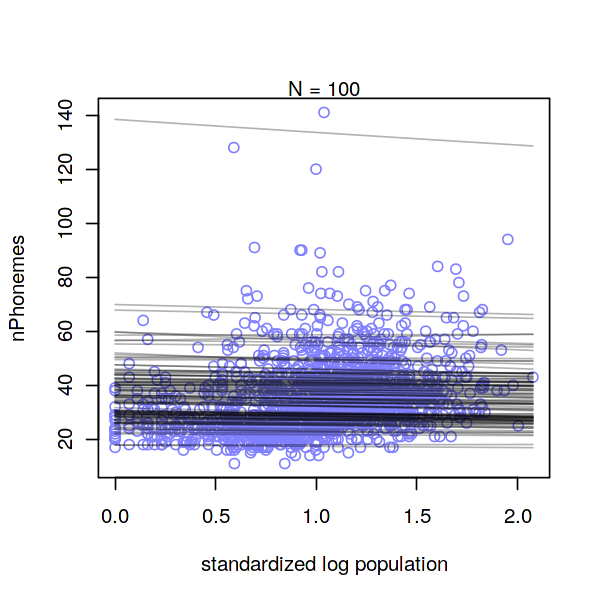

In [142]:
# display raw data and sample size
plot( dd$log_pop_std , d$nPhonemes ,
      xlim=range(dd$log_pop_std) , ylim=range(d$nPhonemes) ,
      col=rangi2 , xlab="standardized log population" , ylab="nPhonemes" )
mtext(concat("N = ",100))

# change j(1:6) to alter continent(random effect control)
cid = 1

# change k(1:5) to alter language family(random effect control)
lf = 1

# plot the lines, with transparency
for ( i in 1:100 )
  curve( exp(post2.3$a[i,cid] +post2.3$c[lf,i] + post2.3$b[i]*x),
         col=col.alpha("black",0.3) , add=TRUE )

package installed on kaggle does not support function LOOPk(), this part has to be ran in rstudio

In [147]:
# posterior
k <- LOOPk(m2.3)
plot( dd$log_pop_std , d$nPhonemes , xlab="standardized log population" , ylab="nPhonemes" ,
      col=rangi2 , pch =ifelse( as.integer(dd$continent)==5 & as.integer(dd$glottologFamily) == 1, 19 , 3 ), lwd=1 ,
      ylim=c(0,75) , cex=1+normalize(k) )

# set up the horizontal axis values to compute predictions at
ns <- 100
P_seq <- seq( from=-1.4 , to=3 , length.out=ns )

# change lf to alter language family(random effect control)
lambda <- link( m2.3 , data=data.frame( pop=P_seq , cid=5, lf = 1 ) )
lmu <- apply( lambda , 2 , mean )
lci <- apply( lambda , 2 , PI )
lines( P_seq , lmu , lty=2 , lwd=1.5 )
shade( lci , P_seq , xpd=TRUE )

ERROR: Error in LOOPk(m2.3): could not find function "LOOPk"


Conclude from the posterior plot, with 2 random variables considered, the lines(posterior) don not go messy and shows a correlation in m2.3.

**Brief sum Poisson models(m2.0, m2.1, m2.2, m2.3)**<br>
In the Poisson models discussed above, we saw correlation with different catigorical predictors regarded or not. There are reasons to believe the corelation between the two variables of interests population and sound inventory size exits, which can be captured by Poisson models instead of linear.

Further observations

In [145]:
# model comparisons via WAIC
compare(m1.0, m1.1, m1.2, m1.3, m2.0, m2.1, m2.2, m2.3)

,WAIC,SE,dWAIC,dSE,pWAIC,weight
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
m1.3,220.8398,60.34064,0.000000,NA,100.981054,9.444585e-01
m1.1,226.5067,59.23912,5.666962,13.75753,120.805533,5.554152e-02
m1.2,695.1837,59.72885,474.343871,42.40687,13.928236,9.391175e-104
m1.0,7843.8430,55.40991,7623.003199,54.77930,2.957615,0.000000e+00
m2.1,11148.5030,188.08304,10927.663228,193.47244,228.444394,0.000000e+00
m2.3,11172.9942,192.71947,10952.154428,197.66173,190.192540,0.000000e+00
m2.2,12019.6990,272.80419,11798.859231,276.97439,46.510084,0.000000e+00
m2.0,13736.0432,364.95640,13515.203405,365.49490,8.790825,0.000000e+00


The first column contains the WAIC values. Smaller values are better, and the models are ordered by WAIC, from best to worst, therefore the best model given the stats above turns out to be m1.3.


In the best model, does the 89% Highest Posterior Density interval for the slope include 0?

In [146]:
# 89% HPDI of the best model
samples <- extract.samples(m1.3)
slope = samples$b
HPDI(samples$b, prob = 0.89)

|0.89       0.89| 
-0.09827522  0.19801964

According to the statistics returned by HPDI(), in the best model, the 89% Highest Posterior Density interval for the slope include 0

**Brief sum**<br>

Given the observations above, it is safe to draw the conclusion that the linear association between the two variables(sound inventory size and population size) is fake, while a corelation exits, which can be captured by Poisson regression.

In [149]:
# generate report
fake_data = data.frame("content" = "none")
save(fake_data,file="fake_data.rda")